# City Sustainability - CNET Model Workflow

## Imports

In [18]:
# Imports

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from keras.models import load_model
from tensorflow.keras import layers
from matplotlib.colors import BoundaryNorm
from sklearn.metrics import confusion_matrix
from matplotlib.colors import ListedColormap
from city_sustainability.models import unet_model
from city_sustainability.quality import life_quality
from tensorflow.keras.callbacks import EarlyStopping
from city_sustainability.loading_data import split_data
from city_sustainability.loading_data import split_data
from city_sustainability.preprocessing import image_resize
from city_sustainability.loading_data import loading_paths
from city_sustainability.models.unet_model import compute_iou
from city_sustainability.loading_data import image_and_label_arrays
from city_sustainability.models.unet_model import build_vgg16_model
from city_sustainability.comparison import class_comparison, qol_comparison

## Load and process images

In [8]:
# Paths for input data and directory containing the train.txt, test.txt, and val.txt files

data_path = '../../raw_data/OpenEarthMap_wo_xBD'
split_files_path = '../../raw_data/OpenEarthMap_wo_xBD/'
(X_train_paths,
 y_train_paths,
 X_val_paths,
 y_val_paths,
 X_test_paths,
 y_test_paths) = split_data (data_path, split_files_path)

print('X_train_paths =', len(X_train_paths))
print('y_train_paths =', len(y_train_paths))
print('X_test_paths =', len(X_test_paths))
print('y_test_paths =', len(y_test_paths))
print('X_val_paths =', len(X_val_paths))
print('y_val_paths =', len(y_val_paths))

X_train_paths = 2303
y_train_paths = 2303
X_test_paths = 0
y_test_paths = 0
X_val_paths = 384
y_val_paths = 384


In [ ]:
# Split the batch into train and test sets

# X_train, X_test, y_train, y_test = train_test_split(X_batch, y_batch, test_size=0.3)

In [9]:
# Load images

X_train, y_train = image_and_label_arrays(X_train_paths, y_train_paths, sampling_ratio=1.0)
# X_test, y_test = image_and_label_arrays(X_train_paths, y_train_paths, sampling_ratio=1.0)
X_val, y_val = image_and_label_arrays(X_val_paths, y_val_paths, sampling_ratio=1.0)

In [10]:
# Scale X and y

X_train_scaled = X_train / 255
# X_test_scaled = X_test / 255
X_val_scaled = X_val / 255

print(X_train_scaled.shape)
# print(X_test_scaled.shape)
print(X_val_scaled.shape)

(2303, 256, 256, 3)
(384, 256, 256, 3)


## CNET Model - VGG16

In [ ]:
#Load a Trained Model

# path = '../../model_training/mallik/model_3001.h5'
# model = load_model(path, custom_objects={'compute_iou': compute_iou})

In [8]:
# Create the model

model = build_vgg16_model(input_shape=(256, 256, 3), num_classes = 9)
# When running from .py
# model_full = unet_model.build_vgg16_model_full(input_shape=(400, 400, 3), num_classes = 9)

2023-05-30 19:30:45.880301: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-30 19:30:45.882795: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [9]:
# Compile the model

unet_model.compile_model(model)

In [10]:
# Model Architecture

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 256, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [11]:
# Model Training and Validation

unet_model.train_model(model, X_train_scaled, y_train, epochs = 50, batch_size=64, validation_data = (X_val_scaled, y_val))

Epoch 1/50


2023-05-30 19:31:34.562769: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 5433458688 exceeds 10% of free system memory.
2023-05-30 19:31:40.985012: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 3221225472 exceeds 10% of free system memory.
2023-05-30 19:31:45.085304: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 3221225472 exceeds 10% of free system memory.


 1/36 [..............................] - ETA: 11:27 - loss: 3.0374 - accuracy: 0.1120 - compute_iou: 0.0565

2023-05-30 19:31:59.209133: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 3221225472 exceeds 10% of free system memory.
2023-05-30 19:32:01.871643: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 3221225472 exceeds 10% of free system memory.


36/36 [==============================] - 645s 18s/step - loss: 2.0764 - accuracy: 0.3140 - compute_iou: 0.1302 - val_loss: 3.7153 - val_accuracy: 0.1841 - val_compute_iou: 0.1118 - lr: 1.0000e-04
Epoch 2/50
36/36 [==============================] - 630s 18s/step - loss: 1.5677 - accuracy: 0.4481 - compute_iou: 0.1910 - val_loss: 2.4660 - val_accuracy: 0.3328 - val_compute_iou: 0.1824 - lr: 1.0000e-04
Epoch 3/50
36/36 [==============================] - 633s 18s/step - loss: 1.4448 - accuracy: 0.4827 - compute_iou: 0.2139 - val_loss: 1.9374 - val_accuracy: 0.4171 - val_compute_iou: 0.2205 - lr: 1.0000e-04
Epoch 4/50
36/36 [==============================] - 655s 18s/step - loss: 1.3841 - accuracy: 0.4993 - compute_iou: 0.2272 - val_loss: 1.6577 - val_accuracy: 0.4499 - val_compute_iou: 0.2371 - lr: 1.0000e-04
Epoch 5/50
36/36 [==============================] - 650s 18s/step - loss: 1.3433 - accuracy: 0.5107 - compute_iou: 0.2366 - val_loss: 1.4479 - val_accuracy: 0.4846 - val_compute_iou: 

In [12]:
# Save the Trained Model in a variable called history

history = _

In [14]:
# Save the Trained Model

model.save('../../model_training/marcel')
model.save('../../model_training/marcel/model.h5')

In [15]:
# Model Test (prediction)

y_pred = model.predict(X_val_scaled)

12/12 [==============================] - 66s 6s/step


In [ ]:
# Verify prediction shape

y_pred.shape

## Model Statistics

In [7]:
#Load a Trained Model

path = '../../model_training/zubair/model_256_vgg_balance_datasplit_3005.h5'
model = load_model(path, custom_objects={'compute_iou': compute_iou})

2023-05-31 10:02:53.352713: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-31 10:02:53.355191: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [14]:
# Model Test (prediction)

y_pred = model.predict(X_val_scaled)

12/12 [==============================] - 33s 3s/step


In [19]:
# Define the class colors dictionary

class_colors = {
    0: '#FFFF00',   # Class 0 - Yellow
    1: '#800000',   # Class 1 - Maroon
    2: '#00FF24',   # Class 2 - Lime Green
    3: '#949494',   # Class 3 - Grey
    4: '#FFFFFF',   # Class 4 - White
    5: '#226126',   # Class 5 - Forest Green
    6: '#0045FF',   # Class 6 - Blue
    7: '#4BB549',   # Class 7 - Dark Green
    8: '#DE1F07'}   # Class 8 - Red

class_descriptions = {
    0: 'Other',
    1: 'Bareland',
    2: 'Rangeland',
    3: 'Developed Space',
    4: 'Road',
    5: 'Tree',
    6: 'Water',
    7: 'Agriculture Land',
    8: 'Building'}

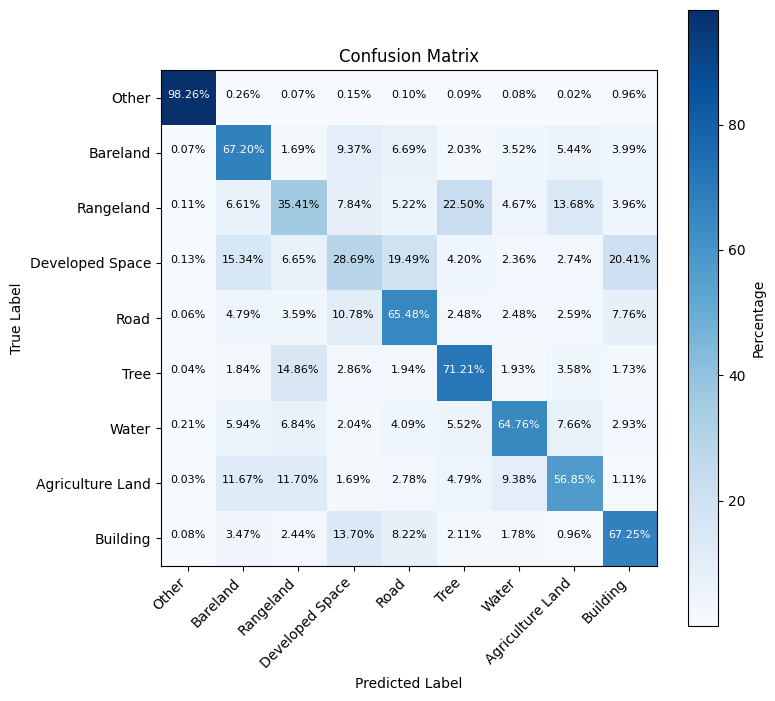

In [31]:
# Confussion Matrix

y_pred_np = np.argmax(y_pred, axis=-1)
y_val_np = np.argmax(y_val, axis=-1)

# Flatten the image arrays
y_val_flattened = np.ravel(y_val_np)
y_pred_flattened = np.ravel(y_pred_np)

 # Compute the confusion matrix
cm = confusion_matrix(y_val_flattened, y_pred_flattened)

 # Convert counts to percentages
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

 # Define color map
cmap = plt.get_cmap('Blues')

 # Plot the confusion matrix
plt.figure(figsize=(8, 8))
plt.imshow(cm_percent, interpolation='nearest', cmap=cmap)
plt.title('Confusion Matrix')
plt.colorbar(label='Percentage')

# Get the class descriptions
class_descriptions = [class_descriptions[i] for i in range(len(class_descriptions))]

# Remove x and y labels
plt.xticks([])
plt.yticks([])

# Add text annotations with class descriptions
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, f'{cm_percent[i, j]:.2f}%', fontsize=8,
                 horizontalalignment="center",
                 color="white" if cm_percent[i, j] > cm_percent.max() / 2 else "black")

# Add class descriptions as x and y labels
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(range(len(class_descriptions)), class_descriptions, rotation=45, ha='right')
plt.yticks(range(len(class_descriptions)), class_descriptions)

plt.show()

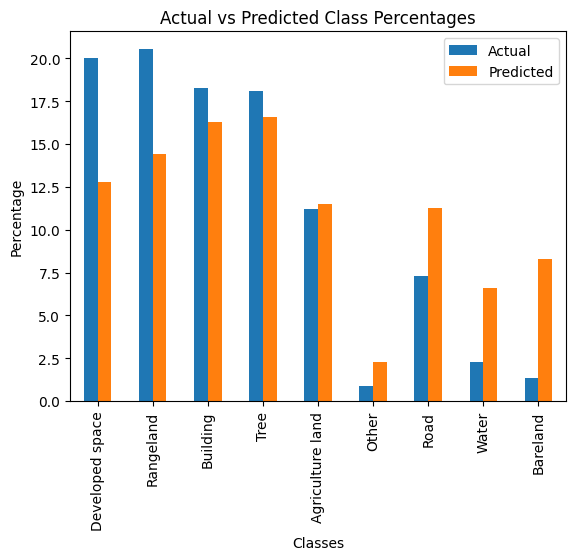

(                  Actual  Predicted  Difference
 Developed space    20.04      12.80        7.24
 Rangeland          20.55      14.41        6.14
 Building           18.27      16.30        1.97
 Tree               18.12      16.60        1.52
 Agriculture land   11.21      11.51       -0.30
 Other               0.88       2.30       -1.42
 Road                7.27      11.25       -3.98
 Water               2.30       6.58       -4.28
 Bareland            1.37       8.26       -6.89,
 None)

In [32]:
# Class comparison validation

class_comparison(y_pred, y_val)

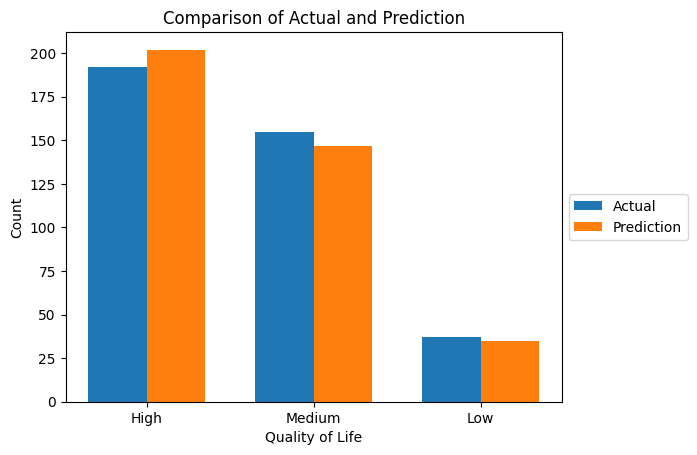

(  Quality of Life  Actual  Prediction
 0            High     192         202
 1          Medium     155         147
 2             Low      37          35,
 None)

In [17]:
# Quality of Life validation

qol_comparison(y_pred, y_val)

## Incluir calcular el modelo en batches usando .fit

## Original images vs predicted

Dont forget to do CTRL+A and CTRL+P to print the images in .pdf

In [33]:
# Create a Table DataFrame from the color dictionary

class_colors = {
    "Other": '#FFFF00',
    "Bareland": '#800000',
    "Rangeland": '#00FF24',
    "Developed space": '#949494',
    "Road": '#FFFFFF',
    "Tree": '#226126',
    "Water": '#0045FF',
    "Agriculture land": '#4BB549',
    "Building": '#DE1F07'}

df = pd.DataFrame(list(class_colors.items()), columns=['Class', 'Color'])

def color_cells(val):
    color = val 
    return 'background-color: %s' % color

class_color = df.style.applymap(color_cells, subset=['Color'])
class_color

,Class,Color
0,Other,#FFFF00
1,Bareland,#800000
2,Rangeland,#00FF24
3,Developed space,#949494
4,Road,#FFFFFF
5,Tree,#226126
6,Water,#0045FF
7,Agriculture land,#4BB549
8,Building,#DE1F07


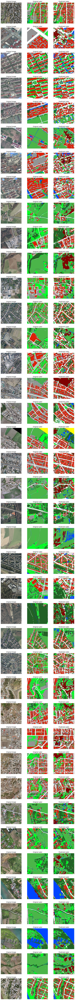

In [34]:
#Plot images to compare: Satellite Original, Label Original and Label Prediction.

# Create Numpy
y_pred_np = np.argmax(y_pred, axis=-1)
y_val_np = np.argmax(y_val, axis=-1)

# Variables
labels = list(range(len(class_colors))) 
colors = list(class_colors.values())     
cmap = ListedColormap(colors)
norm = BoundaryNorm(labels, cmap.N)

# Create the figure and subplots
num_images = 40 
fig, axs = plt.subplots(num_images, 3, figsize=(12, 4 * num_images))

# Iterate through the image sets
for i in range(num_images):
    index = i * 1 
    if index >= len(X_train):
        break
    # Display the original image
    axs[i, 0].imshow(X_val[index])
    axs[i, 0].set_title('Original Image')
    axs[i, 0].axis('off')
    # Display the original label
    axs[i, 1].imshow(y_val_np[index], cmap=cmap, vmin=0, vmax=8)
    axs[i, 1].set_title('Original Label')
    axs[i, 1].axis('off')
    # Display the predicted label
    axs[i, 2].imshow(y_pred_np[index], cmap=cmap, vmin=0, vmax=8)
    axs[i, 2].set_title('Predicted Label')
    axs[i, 2].axis('off')

# Display the figure and adjust the spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.show()